# Data Visulisations and Analysis of Cleaned Data
## Dataframe Processing
This workbook analyses the cleaned raw dataset prior to being run through sentiment analysis. Once run it will provide information of the frequencies and trends in Users, Words (Tokens) and Securities and their individual relationships to being labelled as Bullish or Bearish. 

In [66]:
# Import Dataframe and Processing Libraries
import pandas as pd
from collections import Counter

# Import Data Visulisation Libraries
import matplotlib.pyplot as plt
import numpy as np
from wordcloud import WordCloud

plt.style.use('ggplot')

# set jupyter's max row display
pd.set_option('display.max_row', 1000)

# set jupyter's max column width to 50
pd.set_option('display.max_columns', 50)

In [67]:
# Read and import csv as dataframe
data = pd.read_csv("../12-cleaning-raw-dataset/datasets/cleanedData.csv")
data.head()

,user,message_id,sentiment,content,date,time,securities,tweet text,tokens,num_of_tokens,tokens_in_transformed_text,num_of_tokens_in_transformed_text
0,babybounce,/babybounce/message/226382374,Bullish,$BA travel going green bullish $CCL $RCL $NCLH...,09/07/2020,12:21:03,"['$BA', '$CCL', '$RCL', '$NCLH', '$SPY']",travel going green bullish,"['travel', 'going', 'green', 'bullish']",4,"['travel', 'go', 'green', 'bullish']",4
1,L1_Trading,/L1_Trading/message/226381562,Bullish,$SPY let’s go mooning today,09/07/2020,12:21:03,['$SPY'],let’s go mooning today,"['let', 'go', 'mooning', 'today']",4,"['let', 'go', 'moon', 'today']",4
2,Economist4401,/Economist4401/message/226381511,Bearish,$SPY $SPX $DJIA $DIA $QQQ Analysts on US stock...,09/07/2020,12:21:03,"['$SPY', '$SPX', '$DJIA', '$DIA', '$QQQ']","Analysts on US stock markets: 1. On Monday, Bl...","['analysts', 'us', 'stock', 'markets', 'monday...",58,"['analyst', 'us', 'stock', 'market', 'monday',...",37
3,OkieOkie,/OkieOkie/message/226381256,Bearish,$SPY more China. China wants some of Australia...,09/07/2020,12:21:03,['$SPY'],more China. China wants some of Australia lol🦘🦘🦘🦘,"['china', 'china', 'wants', 'australia', 'lol']",8,"['china', 'china', 'want', 'australia', 'lol']",5
4,risksavage_inthemarket,/risksavage_inthemarket/message/226381105,Bullish,$GNLN $CGC $SPY $KERN $PM “What Does The Insti...,09/07/2020,12:21:03,"['$GNLN', '$CGC', '$SPY', '$KERN', '$PM']",“What Does The Institutional Ownership Tell Us...,"['institutional', 'ownership', 'tell', 'us', '...",80,"['institutional', 'ownership', 'tell', 'us', '...",45


In [68]:
# Total amount of Tweets
len(data)

16874

In [69]:
# Create two boolean tables for bullish and bearish
bullish_tweet_class =  data['sentiment']=='Bullish'
bearish_tweet_class =  data['sentiment']=='Bearish'

In [70]:
# Create two seperate tables for bullish and bearish data
bullish_data = data[bullish_tweet_class]
bearish_data = data[bearish_tweet_class]

bearish_data.head()

,user,message_id,sentiment,content,date,time,securities,tweet text,tokens,num_of_tokens,tokens_in_transformed_text,num_of_tokens_in_transformed_text
2,Economist4401,/Economist4401/message/226381511,Bearish,$SPY $SPX $DJIA $DIA $QQQ Analysts on US stock...,09/07/2020,12:21:03,"['$SPY', '$SPX', '$DJIA', '$DIA', '$QQQ']","Analysts on US stock markets: 1. On Monday, Bl...","['analysts', 'us', 'stock', 'markets', 'monday...",58,"['analyst', 'us', 'stock', 'market', 'monday',...",37
3,OkieOkie,/OkieOkie/message/226381256,Bearish,$SPY more China. China wants some of Australia...,09/07/2020,12:21:03,['$SPY'],more China. China wants some of Australia lol🦘🦘🦘🦘,"['china', 'china', 'wants', 'australia', 'lol']",8,"['china', 'china', 'want', 'australia', 'lol']",5
7,DannETrader,/DannETrader/message/226380472,Bearish,$SPY yesterday was last day of FED repo’s. It ...,09/07/2020,12:21:03,['$SPY'],yesterday was last day of FED repo’s. It isn’t...,"['yesterday', 'last', 'day', 'fed', 'repo', 'i...",12,"['yesterday', 'last', 'day', 'feed', 'repo', '...",8
12,risksavage_inthemarket,/risksavage_inthemarket/message/226382588,Bearish,$SPY $TSLA $BA $JPM $ZM GRAB A NOTEPAD!!! \r\n...,09/07/2020,12:21:34,"['$SPY', '$TSLA', '$BA', '$JPM', '$ZM']",GRAB A NOTEPAD!!! Investing101 FB@risksavagema...,"['grab', 'notepad', 'investing101', 'fb', 'wat...",8,"['grab', 'notepad', 'investing101', 'fb', 'wat...",8
15,ihavespoken,/ihavespoken/message/226383179,Bearish,$SPY 900 point drop in crude coming,09/07/2020,12:25:38,['$SPY'],900 point drop in crude coming,"['point', 'drop', 'crude', 'ing']",5,"['point', 'drop', 'crude', 'ing']",4


In [71]:
print("Total amount of tweets: ", len(data), " \nTotal amount of bullish tweets: ", len(bullish_data), " \nTotal amount of bullish tweets: ", len(bearish_data))

Total amount of tweets:  16874  
Total amount of bullish tweets:  9534  
Total amount of bullish tweets:  7314


# User Analysis and Visulisations
## Dataframe Processing

In [72]:
# Count the amount of tweets for bullish and bearish users
bearish_user_count = Counter(bearish_data['user'])
bullish_user_count = Counter(bullish_data['user'])

In [73]:
# Convert lists into dataframes
df_bullish_users = pd.DataFrame(bullish_user_count.items(), columns=["User", "Bullish Occurences"])
df_bearish_users = pd.DataFrame(bearish_user_count.items(), columns=["User", "Bearish Occurences"])

df_bearish_users.head(3)

,User,Bearish Occurences
0,Economist4401,189
1,OkieOkie,64
2,DannETrader,11


In [74]:
# Join the tables
user_results = df_bullish_users.merge(df_bearish_users, how= 'outer', on= 'User')
user_results['Bullish Occurences'].fillna(0, inplace=True)
user_results['Bearish Occurences'].fillna(0, inplace=True)

user_results.head(3)

,User,Bullish Occurences,Bearish Occurences
0,babybounce,3.0,0.0
1,L1_Trading,34.0,8.0
2,risksavage_inthemarket,44.0,112.0


In [75]:
# Add total column
total_column = user_results['Bullish Occurences'] + user_results['Bearish Occurences']
user_results['Total'] = total_column

user_results.head(3)

,User,Bullish Occurences,Bearish Occurences,Total
0,babybounce,3.0,0.0,3.0
1,L1_Trading,34.0,8.0,42.0
2,risksavage_inthemarket,44.0,112.0,156.0


In [76]:
# Creating Percentage Bullish to Bearish Columns
bullish_percentages = (user_results['Bullish Occurences'] / user_results['Total'])
bearish_percentages = (user_results['Bearish Occurences'] / user_results['Total'])

user_results.insert(2, "Bullish Percentages", bullish_percentages)
user_results.insert(4, "Bearish Percentages", bearish_percentages)

In [77]:
# Filter and Lable Users
user_results.loc[(user_results['Total'] < 20), 'Naive Sentiment Prediction'] = 'Unpredictable'
user_results.loc[(user_results['Total'] >= 20) & (user_results['Bullish Percentages'] <= 0.8) & (user_results['Bullish Percentages'] >= 0.2), 'Naive Sentiment Prediction'] = 'Unpredictable'

user_results.loc[(user_results['Total'] >= 20) & (user_results['Bullish Percentages'] >= 0.8), 'Naive Sentiment Prediction'] = 'Bullish'
user_results.loc[(user_results['Total'] >= 20) & (user_results['Bullish Percentages'] <= 0.2), 'Naive Sentiment Prediction'] = 'Bearish'
user_results.head()

,User,Bullish Occurences,Bullish Percentages,Bearish Occurences,Bearish Percentages,Total,Naive Sentiment Prediction
0,babybounce,3.0,1.000000,0.0,0.000000,3.0,Unpredictable
1,L1_Trading,34.0,0.809524,8.0,0.190476,42.0,Bullish
2,risksavage_inthemarket,44.0,0.282051,112.0,0.717949,156.0,Unpredictable
3,HeyYouWhoMe,123.0,1.000000,0.0,0.000000,123.0,Bullish
4,KaroleinTriedToTrade,6.0,1.000000,0.0,0.000000,6.0,Unpredictable


In [162]:
# Grouped Predictable User Sentiments
grouped_predictions =  user_results.groupby(['Naive Sentiment Prediction']).sum()
grouped_predictions = grouped_predictions.drop(columns = ['Bullish Percentages', 'Bearish Percentages'], axis = 1)
grouped_predictions

,Bullish Occurences,Bearish Occurences,Total
Naive Sentiment Prediction,,,
Bearish,118.0,2592.0,2710.0
Bullish,3512.0,73.0,3585.0
Unpredictable,5904.0,4649.0,10553.0


In [78]:
# Sort by total column and find top 10
user_results = user_results.sort_values(by='Total', ascending = False)
bar_user_results = user_results.head(15)

bar_user_results

,User,Bullish Occurences,Bullish Percentages,Bearish Occurences,Bearish Percentages,Total,Naive Sentiment Prediction
2464,MarsProbe,0.0,0.000000,221.0,1.000000,221.0,Bearish
183,OhYesNotMe,218.0,1.000000,0.0,0.000000,218.0,Bullish
662,VikingTraders,188.0,0.969072,6.0,0.030928,194.0,Bullish
1575,Economist4401,2.0,0.010471,189.0,0.989529,191.0,Bearish
915,SeriouslyFurious,191.0,1.000000,0.0,0.000000,191.0,Bullish
2,risksavage_inthemarket,44.0,0.282051,112.0,0.717949,156.0,Unpredictable
1469,InvestorShock,22.0,0.153846,121.0,0.846154,143.0,Bearish
153,soldierofcourage,123.0,1.000000,0.0,0.000000,123.0,Bullish
3,HeyYouWhoMe,123.0,1.000000,0.0,0.000000,123.0,Bullish
164,DefStar,117.0,1.000000,0.0,0.000000,117.0,Bullish


In [79]:
#filtering tweets for 20 + tweets by User and over 80% lean towards bullish or Bearish
predictable_user_boo = user_results['Naive Sentiment Prediction'] != 'Unpredictable'
predictable_user = user_results[predictable_user_boo]
predictable_user.head()

,User,Bullish Occurences,Bullish Percentages,Bearish Occurences,Bearish Percentages,Total,Naive Sentiment Prediction
2464,MarsProbe,0.0,0.000000,221.0,1.000000,221.0,Bearish
183,OhYesNotMe,218.0,1.000000,0.0,0.000000,218.0,Bullish
662,VikingTraders,188.0,0.969072,6.0,0.030928,194.0,Bullish
1575,Economist4401,2.0,0.010471,189.0,0.989529,191.0,Bearish
915,SeriouslyFurious,191.0,1.000000,0.0,0.000000,191.0,Bullish


In [80]:
#filtering tweets for 20 + tweets by User and over 80% lean towards bullish or Bearish
unpredictable_user_boo = user_results['Naive Sentiment Prediction'] == 'Unpredictable'
unpredictable_user = user_results[unpredictable_user_boo]
unpredictable_user.head()

,User,Bullish Occurences,Bullish Percentages,Bearish Occurences,Bearish Percentages,Total,Naive Sentiment Prediction
2,risksavage_inthemarket,44.0,0.282051,112.0,0.717949,156.0,Unpredictable
350,v3tuz,30.0,0.303030,69.0,0.696970,99.0,Unpredictable
204,RealTimeTradingIdeas,54.0,0.574468,40.0,0.425532,94.0,Unpredictable
148,2020_25K_Challenge,49.0,0.671233,24.0,0.328767,73.0,Unpredictable
1173,johnv345,15.0,0.227273,51.0,0.772727,66.0,Unpredictable


In [81]:
# Export Table to Excel (If needed)
user_results.to_csv(r"./userCount.csv", index = True)

## User Data Visulisations

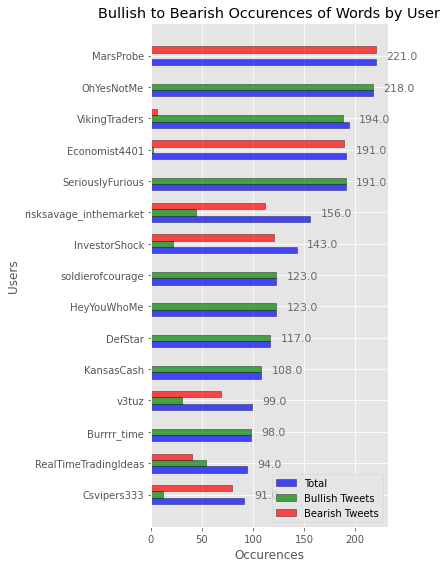

In [82]:
# Create Bar Chart of user and occurences
y_user = bar_user_results['User'].tolist()
y_user.reverse()

y_user_indexes = np.arange(len(y_user))
height = 0.2

x_user_bull = bar_user_results['Bullish Occurences'].tolist()
x_user_bear = bar_user_results['Bearish Occurences'].tolist()
x_user_total = bar_user_results['Total'].tolist()

x_user_bull.reverse()
x_user_bear.reverse()
x_user_total.reverse()

plt.figure(figsize=(6,8))

multi = plt.subplot()
rects1 = multi.barh(y_user_indexes - height, x_user_total, height = height, edgecolor='black',  color = 'blue', alpha = 0.7, label = 'Total')
rects2 = multi.barh(y_user_indexes, x_user_bull, height = height, edgecolor='black', color = 'green', alpha = 0.7, label = 'Bullish Tweets')
rects3 = multi.barh(y_user_indexes + height, x_user_bear, height = height, edgecolor='black' , color = 'red', alpha = 0.7, label = 'Bearish Tweets')

plt.xlabel('Occurences')
plt.ylabel('Users')
plt.yticks(ticks = y_user_indexes, labels = y_user)
plt.title('Bullish to Bearish Occurences of Words by User')

# set individual bar lables using above list
for i in rects1:
    # get_width pulls left or right; get_y pushes up or down
    plt.text(i.get_width() + 10, i.get_y() + .18, \
            str(round((i.get_width()), 2)), fontsize=11, color='dimgrey')

plt.legend()
plt.tight_layout()
plt.show()

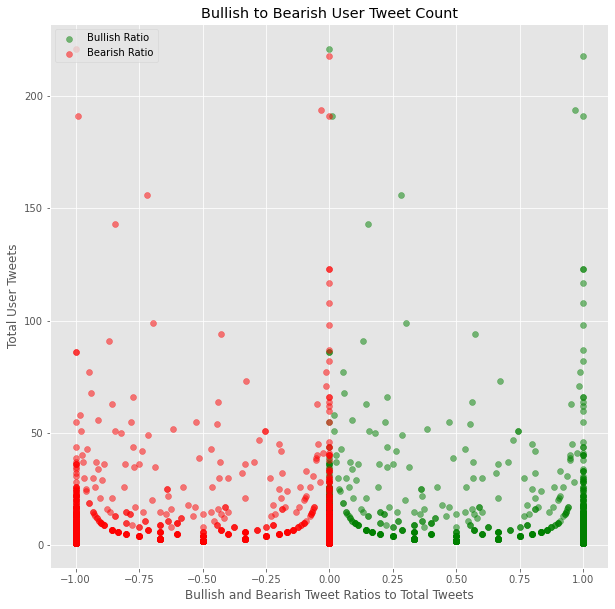

In [83]:
# Plot the Scatter Graph
x_bull = user_results['Bullish Percentages'].tolist()
x_bear = (user_results['Bearish Percentages']*-1).tolist()
y_user_tweets = user_results['Total'].tolist()

plt.figure(figsize=(10,10))

plt.title('Bullish to Bearish User Tweet Ratios')
plt.xlabel('Bullish and Bearish Tweet Ratios to Total Tweets')
plt.ylabel('Total User Tweets')

bull = plt.scatter(x_bull, y_user_tweets, alpha = 0.5, c='g')
bear = plt.scatter(x_bear, y_user_tweets, alpha = 0.5, c='r')

plt.legend((bull, bear), ('Bullish Ratio', 'Bearish Ratio'), loc='upper left', fontsize=10)

plt.show()

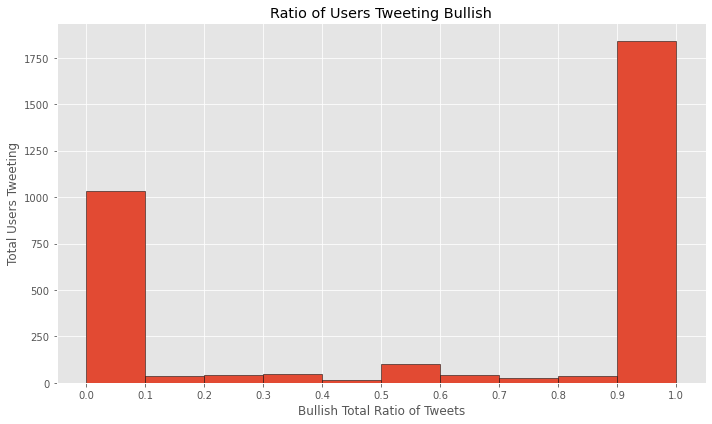

In [84]:
# Histogram for ratio's of Bullish to Total Tweets
x_ratios = user_results['Bullish Percentages'].tolist()
bins = [0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]

plt.figure(figsize = (10,6))

plt.hist(x_ratios, bins = bins, edgecolor = 'black')

plt.title('Ratio of Users Tweeting Bullish')
plt.xlabel('Bullish Total Ratio of Tweets')
plt.ylabel('Total Users Tweeting')
plt.xticks(ticks = bins)

plt.tight_layout()

plt.show()

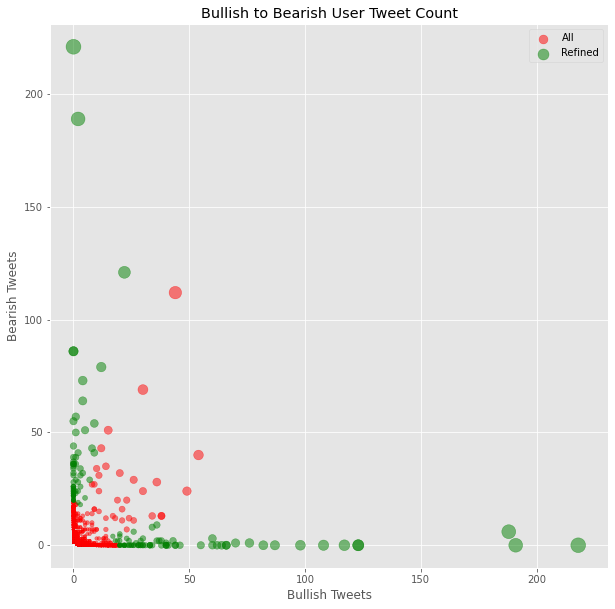

In [85]:
#predictable_user = predictable_user.sort_values(by='Total', ascending= False)
x_bull = unpredictable_user['Bullish Occurences'].tolist()
y_bear = unpredictable_user['Bearish Occurences'].tolist()
s_total = unpredictable_user['Total'].tolist()

x_bull_ref = predictable_user['Bullish Occurences'].tolist()
y_bear_ref = predictable_user['Bearish Occurences'].tolist()
s_total_ref = predictable_user['Total'].tolist()

plt.figure(figsize=(10,10))

#ax1 = plt.add_subplot(111)
plt.scatter(x_bull, y_bear, s = s_total, alpha = 0.5, c = 'r', label = 'All')
plt.scatter(x_bull_ref, y_bear_ref, s = s_total_ref, alpha = 0.5, c = 'g', label = 'Refined')

plt.legend(loc='upper right')
plt.title('Bullish to Bearish User Tweet Count and Predictable Values')
plt.xlabel('Bullish Tweets')
plt.ylabel('Bearish Tweets')

# Find maximum plot value of bullish or bearish tweets
if max(x_bull) >= max(y_bear):
    plt.xlim(-10, max(x_bull and x_bull_ref) + 10)
    plt.ylim(-10, max(x_bull and x_bull_ref) + 10)
else:
    plt.xlim(-10, max(y_bear and y_bear_ref) + 10)
    plt.ylim(-10, max(y_bear and y_bear_ref) + 10)

plt.show()

# Token Analysis and Validation
## Token Dataframe Processing

In [86]:
# count occurences of words of value
bullish_words = [word for tweet in bullish_data['tokens_in_transformed_text'] for word in tweet.replace(",", "").replace("[", "").replace("]", "").replace("'", "").split(' ')]
bullish_word_count = Counter(bullish_words)

bearish_words = [word for tweet in bearish_data['tokens_in_transformed_text'] for word in tweet.replace(",", "").replace("[", "").replace("]", "").replace("'", "").split(' ')]
bearish_word_count = Counter(bearish_words)

In [87]:
# ------------------- Convert lists into dataframes --------------------------------------
df_bullish = pd.DataFrame(bullish_word_count.items(), columns=["Word", "Bullish Occurences"])

df_bearish = pd.DataFrame(bearish_word_count.items(), columns=["Word", "Bearish Occurences"])
df_bearish.head()

,Word,Bearish Occurences
0,analyst,26
1,us,253
2,stock,427
3,market,951
4,monday,113


In [88]:
# Join the tables
token_results = df_bullish.merge(df_bearish, how= 'outer', on= 'Word')
token_results['Bullish Occurences'].fillna(0, inplace=True)
token_results['Bearish Occurences'].fillna(0, inplace=True)
token_results.head()

,Word,Bullish Occurences,Bearish Occurences
0,travel,15.0,13.0
1,go,1161.0,941.0
2,green,345.0,143.0
3,bullish,348.0,115.0
4,let,356.0,238.0


In [89]:
# Add total column
total_column = token_results['Bullish Occurences'] + token_results['Bearish Occurences']
token_results['Total'] = total_column
token_results

,Word,Bullish Occurences,Bearish Occurences,Total
0,travel,15.0,13.0,28.0
1,go,1161.0,941.0,2102.0
2,green,345.0,143.0,488.0
3,bullish,348.0,115.0,463.0
4,let,356.0,238.0,594.0
...,...,...,...,...
12303,rekted,0.0,2.0,2.0
12304,replication,0.0,1.0,1.0
12305,aeroflot,0.0,1.0,1.0
12306,droop,0.0,1.0,1.0


In [90]:
# Creating Percentage Bullish to Bearish Columns
bullish_percentages = (token_results['Bullish Occurences'] / token_results['Total'])
bearish_percentages = (token_results['Bearish Occurences'] / token_results['Total'])

token_results.insert(2, "Bullish Percentages", bullish_percentages)
token_results.insert(4, "Bearish Percentages", bearish_percentages)

In [91]:
# Sort by total column and find top 15
token_results = token_results.sort_values(by='Total', ascending= False)
token_results.head()

,Word,Bullish Occurences,Bullish Percentages,Bearish Occurences,Bearish Percentages,Total
1,go,1161.0,0.552331,941.0,0.447669,2102.0
80,not,822.0,0.446254,1020.0,0.553746,1842.0
20,market,792.0,0.454389,951.0,0.545611,1743.0
46,get,885.0,0.538321,759.0,0.461679,1644.0
53,bear,1287.0,0.852318,223.0,0.147682,1510.0


In [92]:
# Filter and Lable Users
token_results.loc[(token_results['Total'] < 20), 'Naive Sentiment Prediction'] = 'Unpredictable'
token_results.loc[(token_results['Total'] >= 20) & (token_results['Bullish Percentages'] <= 0.8) & (token_results['Bullish Percentages'] >= 0.2), 'Naive Sentiment Prediction'] = 'Unpredictable'

token_results.loc[(token_results['Total'] >= 20) & (token_results['Bullish Percentages'] >= 0.8), 'Naive Sentiment Prediction'] = 'Bullish'
token_results.loc[(token_results['Total'] >= 20) & (token_results['Bullish Percentages'] <= 0.2), 'Naive Sentiment Prediction'] = 'Bearish'
token_results.head()

,Word,Bullish Occurences,Bullish Percentages,Bearish Occurences,Bearish Percentages,Total,Naive Sentiment Prediction
1,go,1161.0,0.552331,941.0,0.447669,2102.0,Unpredictable
80,not,822.0,0.446254,1020.0,0.553746,1842.0,Unpredictable
20,market,792.0,0.454389,951.0,0.545611,1743.0,Unpredictable
46,get,885.0,0.538321,759.0,0.461679,1644.0,Unpredictable
53,bear,1287.0,0.852318,223.0,0.147682,1510.0,Bullish


In [163]:
# Grouped Predictable User Sentiments
grouped_predictions =  token_results.groupby(['Naive Sentiment Prediction']).sum()
grouped_predictions = grouped_predictions.drop(columns = ['Bullish Percentages', 'Bearish Percentages'], axis = 1)
grouped_predictions

,Bullish Occurences,Bearish Occurences,Total
Naive Sentiment Prediction,,,
Bearish,201.0,1117.0,1318.0
Bullish,6360.0,731.0,7091.0
Unpredictable,78415.0,69689.0,148104.0


In [93]:
# Sort by total column and find top 10
token_results = token_results.sort_values(by='Total', ascending = False)
bar_token_results = token_results.head(15)

bar_token_results

,Word,Bullish Occurences,Bullish Percentages,Bearish Occurences,Bearish Percentages,Total,Naive Sentiment Prediction
1,go,1161.0,0.552331,941.0,0.447669,2102.0,Unpredictable
80,not,822.0,0.446254,1020.0,0.553746,1842.0,Unpredictable
20,market,792.0,0.454389,951.0,0.545611,1743.0,Unpredictable
46,get,885.0,0.538321,759.0,0.461679,1644.0,Unpredictable
53,bear,1287.0,0.852318,223.0,0.147682,1510.0,Bullish
109,buy,790.0,0.649671,426.0,0.350329,1216.0,Unpredictable
60,day,704.0,0.614847,441.0,0.385153,1145.0,Unpredictable
33,stock,652.0,0.604263,427.0,0.395737,1079.0,Unpredictable
337,week,540.0,0.556128,431.0,0.443872,971.0,Unpredictable
38,like,503.0,0.528361,449.0,0.471639,952.0,Unpredictable


In [94]:
#filtering tweets for 20 + tweets by User and over 80% lean towards bullish or Bearish
predictable_token_boo = token_results['Naive Sentiment Prediction'] != 'Unpredictable'
predictable_token = token_results[predictable_token_boo]
predictable_token.head()

,Word,Bullish Occurences,Bullish Percentages,Bearish Occurences,Bearish Percentages,Total,Naive Sentiment Prediction
53,bear,1287.0,0.852318,223.0,0.147682,1510.0,Bullish
64,trading,370.0,0.839002,71.0,0.160998,441.0,Bullish
71,option,319.0,0.866848,49.0,0.133152,368.0,Bullish
73,invite,293.0,0.993220,2.0,0.006780,295.0,Bullish
72,discord,290.0,0.996564,1.0,0.003436,291.0,Bullish


In [95]:
#filtering tweets for 20 + tweets by User and over 80% lean towards bullish or Bearish
unpredictable_token_boo = token_results['Naive Sentiment Prediction'] == 'Unpredictable'
unpredictable_token = token_results[unpredictable_token_boo]
unpredictable_token.head()

,Word,Bullish Occurences,Bullish Percentages,Bearish Occurences,Bearish Percentages,Total,Naive Sentiment Prediction
1,go,1161.0,0.552331,941.0,0.447669,2102.0,Unpredictable
80,not,822.0,0.446254,1020.0,0.553746,1842.0,Unpredictable
20,market,792.0,0.454389,951.0,0.545611,1743.0,Unpredictable
46,get,885.0,0.538321,759.0,0.461679,1644.0,Unpredictable
109,buy,790.0,0.649671,426.0,0.350329,1216.0,Unpredictable


In [96]:
# Export Table to Excel (If needed)
token_results.to_csv(r"./wordCount.csv", index = True)

## Token Data Visulisations

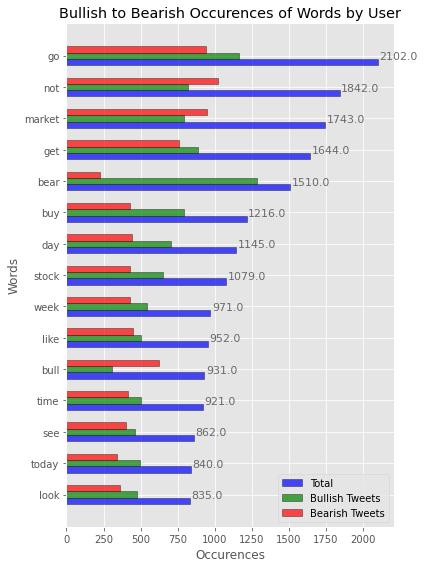

In [97]:
# Create Bar Chart of user and occurences
y_token_word = bar_token_results['Word'].tolist()
y_token_word.reverse()

y_token_indexes = np.arange(len(y_token_word))
height = 0.2

x_token_bull = bar_token_results['Bullish Occurences'].tolist()
x_token_bear = bar_token_results['Bearish Occurences'].tolist()
x_token_total = bar_token_results['Total'].tolist()

x_token_bull.reverse()
x_token_bear.reverse()
x_token_total.reverse()

plt.figure(figsize=(6,8))

multi = plt.subplot()
rects1 = multi.barh(y_token_indexes - height, x_token_total, height = height, edgecolor='black',  color = 'blue', alpha = 0.7, label = 'Total')
rects2 = multi.barh(y_token_indexes, x_token_bull, height = height, edgecolor='black', color = 'green', alpha = 0.7, label = 'Bullish Tweets')
rects3 = multi.barh(y_token_indexes + height, x_token_bear, height = height, edgecolor='black' , color = 'red', alpha = 0.7, label = 'Bearish Tweets')

plt.xlabel('Occurences')
plt.ylabel('Words')
plt.yticks(ticks = y_token_indexes, labels = y_token_word)
plt.title('Bullish to Bearish Occurences of Words by Token')

# set individual bar lables using above list
for i in rects1:
    # get_width pulls left or right; get_y pushes up or down
    plt.text(i.get_width() + 10, i.get_y() + .18, \
            str(round((i.get_width()), 2)), fontsize=11, color='dimgrey')

plt.legend()
plt.tight_layout()
plt.show()

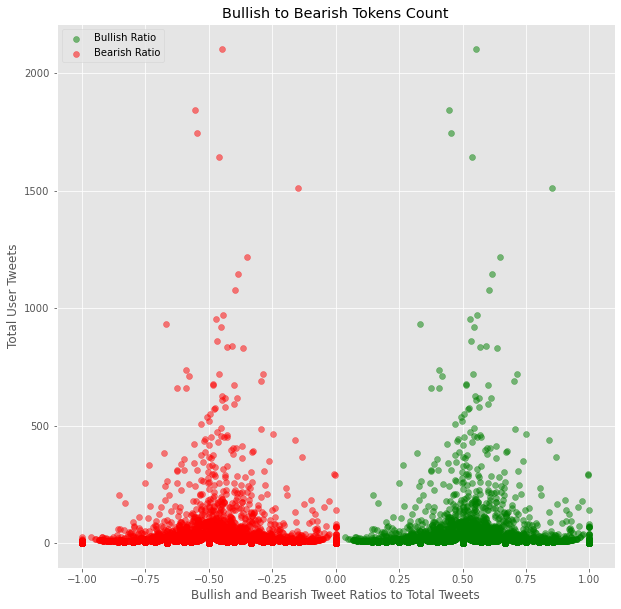

In [98]:
# Plot the Scatter Graph
x_bull = token_results['Bullish Percentages'].tolist()
x_bear = (token_results['Bearish Percentages']*-1).tolist()
y_user_tweets = token_results['Total'].tolist()

plt.figure(figsize=(10,10))

plt.title('Bullish to Bearish Tokens Sentiment Ratios')
plt.xlabel('Bullish and Bearish Tweet Ratios to Total Tweets')
plt.ylabel('Total User Tweets')

bull = plt.scatter(x_bull, y_user_tweets, alpha = 0.5, c='g')
bear = plt.scatter(x_bear, y_user_tweets, alpha = 0.5, c='r')

plt.legend((bull, bear), ('Bullish Ratio', 'Bearish Ratio'), loc='upper left', fontsize=10)

plt.show()

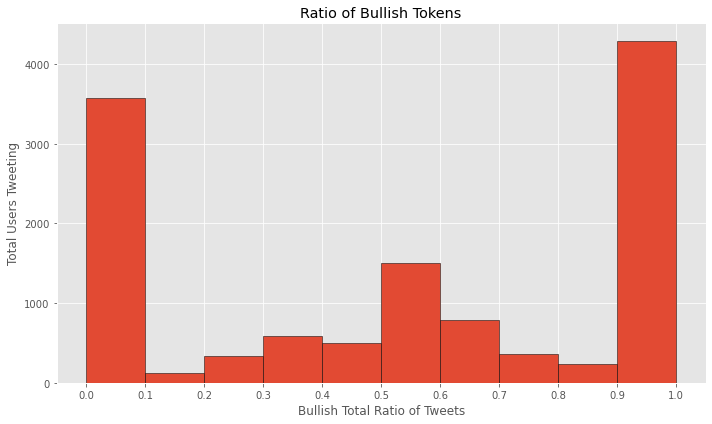

In [99]:
# Histogram for ratio's of Bullish to Total Tweets
x_ratios = token_results['Bullish Percentages'].tolist()
bins = [0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]

plt.figure(figsize = (10,6))

plt.hist(x_ratios, bins = bins, edgecolor = 'black')

plt.title('Ratio of Bullish to Total Tokens')
plt.xlabel('Bullish Total Ratio of Tweets')
plt.ylabel('Total Users Tweeting')
plt.xticks(ticks = bins)

plt.tight_layout()

plt.show()

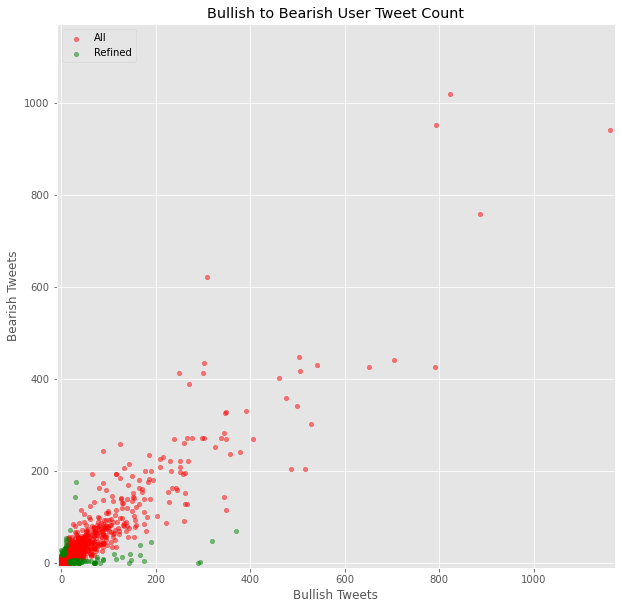

In [100]:
x_bull = unpredictable_token['Bullish Occurences'].tolist()
y_bear = unpredictable_token['Bearish Occurences'].tolist()
s_total = unpredictable_token['Total'].tolist()

x_bull_ref = predictable_token['Bullish Occurences'].tolist()
y_bear_ref = predictable_token['Bearish Occurences'].tolist()
s_total_ref = predictable_token['Total'].tolist()

plt.figure(figsize=(10,10))

plt.scatter(x_bull, y_bear, s = 20, alpha = 0.5, c = 'r', label = 'All')
plt.scatter(x_bull_ref, y_bear_ref, s = 20, alpha = 0.5, c = 'g', label = 'Refined')

plt.legend(loc='upper left')
plt.title('Bullish to Bearish Count of Tokens in Tweets')
plt.xlabel('Bullish Tweets')
plt.ylabel('Bearish Tweets')

# Find maximum plot value of bullish or bearish tweets
if max(x_bull) >= max(y_bear):
    plt.xlim(-10, max(x_bull) + 10)
    plt.ylim(-10, max(x_bull) + 10)
else:
    plt.xlim(-10, max(y_bear) + 10)
    plt.ylim(-10, max(y_bear) + 10)

plt.show()

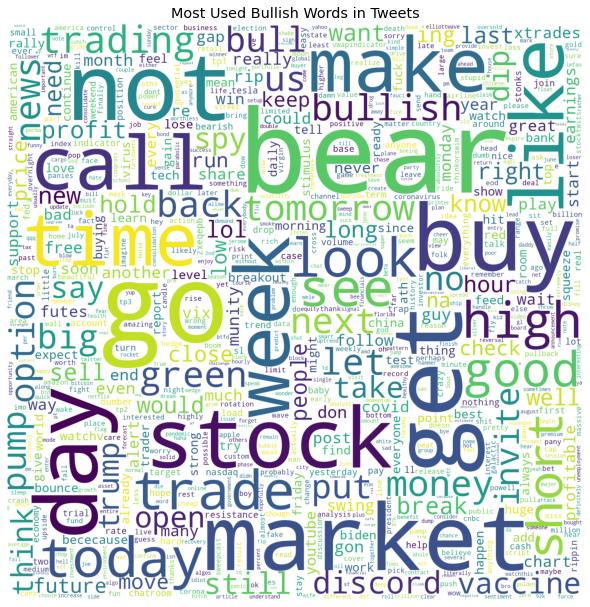

In [101]:
# Bullish Word Cloud
word_freq = token_results.set_index('Word')['Bullish Occurences'].to_dict()

wordcloud = WordCloud(width = 1500, 
                height = 1500, 
                background_color ='white',
                max_words = 800,
                max_font_size = 300, 
                min_font_size = 10).generate(str(token_results['Word'])) 

wordcloud.generate_from_frequencies(word_freq)
                      
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0)
plt.title('Most Used Bullish Words in Tweets')
  
plt.show() 

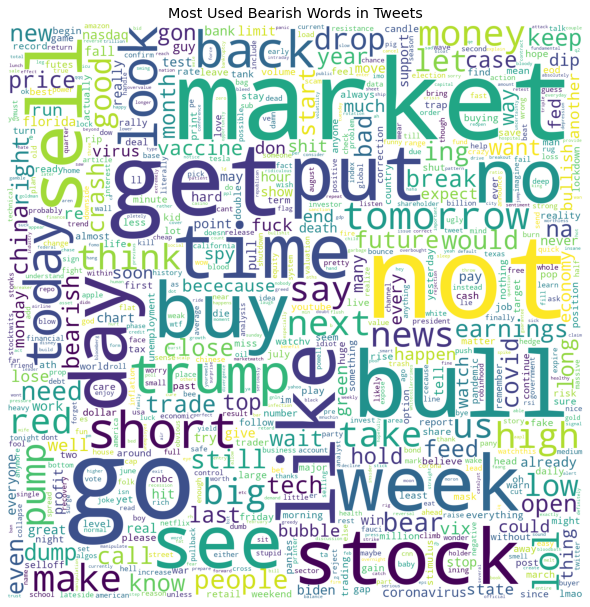

In [102]:
# Bearish Word Cloud
word_freq = token_results.set_index('Word')['Bearish Occurences'].to_dict()

wordcloud = WordCloud(width = 1500, 
                height = 1500, 
                background_color ='white',
                max_words = 800,
                max_font_size = 300, 
                min_font_size = 10).generate(str(token_results['Word'])) 

wordcloud.generate_from_frequencies(word_freq)
                      
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0)
plt.title('Most Used Bearish Words in Tweets')
  
plt.show() 

# Security Analysis and Vaidation
## Security Dataframe Processing

In [120]:
# count occurences of words of value
bullish_words = [word for tweet in bullish_data['securities'] for word in tweet.replace(",", "").replace("[", "").replace("]", "").replace("'", "").split(' ')]
bullish_word_count = Counter(bullish_words)

bearish_words = [word for tweet in bearish_data['securities'] for word in tweet.replace(",", "").replace("[", "").replace("]", "").replace("'", "").split(' ')]
bearish_word_count = Counter(bearish_words)

In [121]:
# ------------------- Convert lists into dataframes --------------------------------------
df_bullish = pd.DataFrame(bullish_word_count.items(), columns=["Security", "Bullish Occurences"])

df_bearish = pd.DataFrame(bearish_word_count.items(), columns=["Security", "Bearish Occurences"])
df_bearish.head()

,Security,Bearish Occurences
0,$SPY,7339
1,$SPX,262
2,$DJIA,252
3,$DIA,174
4,$QQQ,607


In [122]:
# Join the tables
sec_results = df_bullish.merge(df_bearish, how= 'outer', on= 'Security')
sec_results['Bullish Occurences'].fillna(0, inplace=True)
sec_results['Bearish Occurences'].fillna(0, inplace=True)
sec_results.head()

,Security,Bullish Occurences,Bearish Occurences
0,$BA,172.0,45.0
1,$CCL,37.0,15.0
2,$RCL,10.0,9.0
3,$NCLH,43.0,11.0
4,$SPY,9562.0,7339.0


In [123]:
# Add total column (and remove $SPY as It's included in almost all tweets and skews the data)
total_column = sec_results['Bullish Occurences'] + sec_results['Bearish Occurences']
sec_results['Total'] = total_column

sec_results = sec_results[sec_results.Security != '$SPY']
sec_results

,Security,Bullish Occurences,Bearish Occurences,Total
0,$BA,172.0,45.0,217.0
1,$CCL,37.0,15.0,52.0
2,$RCL,10.0,9.0,19.0
3,$NCLH,43.0,11.0,54.0
5,$GNLN,43.0,16.0,59.0
...,...,...,...,...
1569,$HA,0.0,1.0,1.0
1570,$236.,0.0,1.0,1.0
1571,$.30,0.0,1.0,1.0
1572,$30!!,0.0,1.0,1.0


In [124]:
# Creating Percentage Bullish to Bearish Columns
bullish_percentages = (sec_results['Bullish Occurences'] / sec_results['Total'])
bearish_percentages = (sec_results['Bearish Occurences'] / sec_results['Total'])

sec_results.insert(2, "Bullish Percentages", bullish_percentages)
sec_results.insert(4, "Bearish Percentages", bearish_percentages)

In [125]:
# Filter and Lable Security
sec_results.loc[(sec_results['Total'] < 20), 'Naive Sentiment Prediction'] = 'Unpredictable'
sec_results.loc[(sec_results['Total'] >= 20) & (sec_results['Bullish Percentages'] <= 0.8) & (sec_results['Bullish Percentages'] >= 0.2), 'Naive Sentiment Prediction'] = 'Unpredictable'

sec_results.loc[(sec_results['Total'] >= 20) & (sec_results['Bullish Percentages'] >= 0.8), 'Naive Sentiment Prediction'] = 'Bullish'
sec_results.loc[(sec_results['Total'] >= 20) & (sec_results['Bullish Percentages'] <= 0.2), 'Naive Sentiment Prediction'] = 'Bearish'
sec_results.head()

,Security,Bullish Occurences,Bullish Percentages,Bearish Occurences,Bearish Percentages,Total,Naive Sentiment Prediction
0,$BA,172.0,0.792627,45.0,0.207373,217.0,Unpredictable
1,$CCL,37.0,0.711538,15.0,0.288462,52.0,Unpredictable
2,$RCL,10.0,0.526316,9.0,0.473684,19.0,Unpredictable
3,$NCLH,43.0,0.796296,11.0,0.203704,54.0,Unpredictable
5,$GNLN,43.0,0.728814,16.0,0.271186,59.0,Unpredictable


In [164]:
# Grouped Predictable Security Sentiments
grouped_predictions =  sec_results.groupby(['Naive Sentiment Prediction']).sum()
grouped_predictions = grouped_predictions.drop(columns = ['Bullish Percentages', 'Bearish Percentages'], axis = 1)
grouped_predictions

,Bullish Occurences,Bearish Occurences,Total
Naive Sentiment Prediction,,,
Bearish,10.0,56.0,66.0
Bullish,1986.0,280.0,2266.0
Unpredictable,6561.0,3431.0,9992.0


In [126]:
# Sort by total column and find top 10
sec_results = sec_results.sort_values(by='Total', ascending = False)
bar_sec_results = sec_results.head(15)

bar_sec_results

,Security,Bullish Occurences,Bullish Percentages,Bearish Occurences,Bearish Percentages,Total,Naive Sentiment Prediction
11,$QQQ,699.0,0.535222,607.0,0.464778,1306.0,Unpredictable
17,$TSLA,565.0,0.692402,251.0,0.307598,816.0,Unpredictable
46,$AAPL,450.0,0.750000,150.0,0.250000,600.0,Unpredictable
54,$AMZN,372.0,0.800000,93.0,0.200000,465.0,Bullish
27,$DJIA,176.0,0.411215,252.0,0.588785,428.0,Unpredictable
29,$SPX,108.0,0.291892,262.0,0.708108,370.0,Unpredictable
19,$DIA,139.0,0.444089,174.0,0.555911,313.0,Unpredictable
14,$MSFT,228.0,0.826087,48.0,0.173913,276.0,Bullish
49,$NFLX,146.0,0.632035,85.0,0.367965,231.0,Unpredictable
0,$BA,172.0,0.792627,45.0,0.207373,217.0,Unpredictable


In [127]:
#filtering tweets for 20 + tweets by User and over 80% lean towards bullish or Bearish
predictable_sec_boo = sec_results['Naive Sentiment Prediction'] != 'Unpredictable'
predictable_sec = sec_results[predictable_sec_boo]
predictable_sec.head()

,Security,Bullish Occurences,Bullish Percentages,Bearish Occurences,Bearish Percentages,Total,Naive Sentiment Prediction
54,$AMZN,372.0,0.800000,93.0,0.200000,465.0,Bullish
14,$MSFT,228.0,0.826087,48.0,0.173913,276.0,Bullish
56,$AMD,163.0,0.802956,40.0,0.197044,203.0,Bullish
66,$SPCE,129.0,0.895833,15.0,0.104167,144.0,Bullish
69,$ROKU,101.0,0.926606,8.0,0.073394,109.0,Bullish


In [128]:
#filtering tweets for 20 + tweets by User and over 80% lean towards bullish or Bearish
unpredictable_sec_boo = sec_results['Naive Sentiment Prediction'] == 'Unpredictable'
unpredictable_sec = sec_results[unpredictable_sec_boo]
unpredictable_sec.head()

,Security,Bullish Occurences,Bullish Percentages,Bearish Occurences,Bearish Percentages,Total,Naive Sentiment Prediction
11,$QQQ,699.0,0.535222,607.0,0.464778,1306.0,Unpredictable
17,$TSLA,565.0,0.692402,251.0,0.307598,816.0,Unpredictable
46,$AAPL,450.0,0.750000,150.0,0.250000,600.0,Unpredictable
27,$DJIA,176.0,0.411215,252.0,0.588785,428.0,Unpredictable
29,$SPX,108.0,0.291892,262.0,0.708108,370.0,Unpredictable


In [129]:
# Export Table to Excel (If needed)
sec_results.to_csv(r"./securityCount.csv", index = True)

## Security Data Visulisation

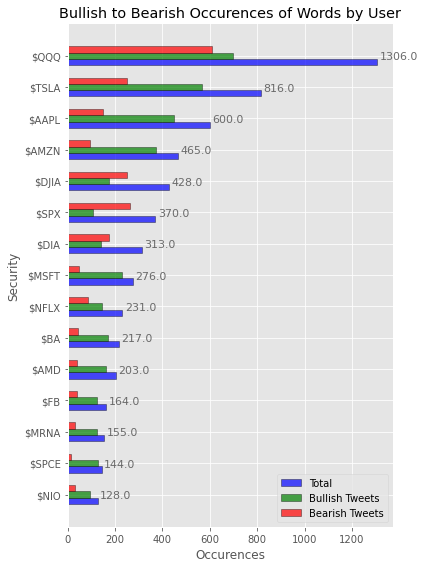

In [130]:
# Create Bar Chart of user and occurences
y_security = bar_sec_results['Security'].tolist()
y_security.reverse()

y_indexes = np.arange(len(y_security))
height = 0.2

x_bull = bar_sec_results['Bullish Occurences'].tolist()
x_bear = bar_sec_results['Bearish Occurences'].tolist()
x_total = bar_sec_results['Total'].tolist()

x_bull.reverse()
x_bear.reverse()
x_total.reverse()

plt.figure(figsize=(6,8))

multi = plt.subplot()
rects1 = multi.barh(y_indexes - height, x_total, height = height, edgecolor='black',  color = 'blue', alpha = 0.7, label = 'Total')
rects2 = multi.barh(y_indexes, x_bull, height = height, edgecolor='black', color = 'green', alpha = 0.7, label = 'Bullish Tweets')
rects3 = multi.barh(y_indexes + height, x_bear, height = height, edgecolor='black' , color = 'red', alpha = 0.7, label = 'Bearish Tweets')

plt.xlabel('Occurences')
plt.ylabel('Security')
plt.yticks(ticks = y_indexes, labels = y_security)
plt.title('Bullish to Bearish Occurences of Words by Security')

# set individual bar lables using above list
for i in rects1:
    # get_width pulls left or right; get_y pushes up or down
    plt.text(i.get_width() + 10, i.get_y() + .18, \
            str(round((i.get_width()), 2)), fontsize=11, color='dimgrey')

plt.legend()
plt.tight_layout()
plt.show()

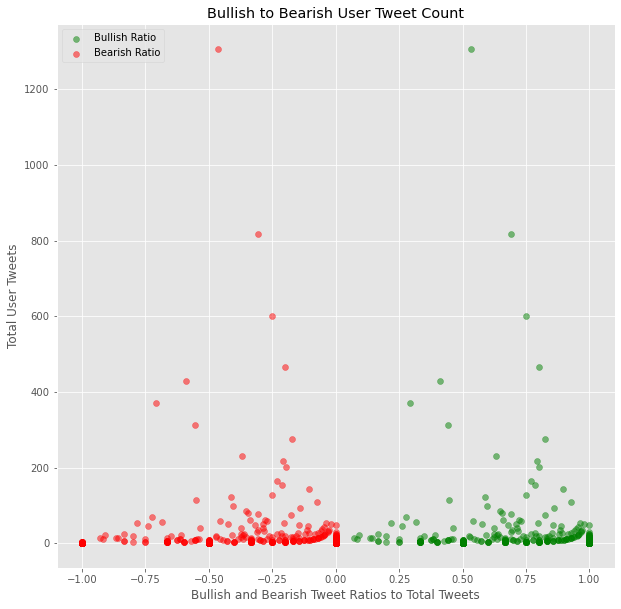

In [138]:
# Plot the Scatter Graph
x_bull = sec_results['Bullish Percentages'].tolist()
x_bear = (sec_results['Bearish Percentages']*-1).tolist()
y_user_tweets = sec_results['Total'].tolist()

plt.figure(figsize=(10,10))

plt.title('Bullish to Bearish Security Ratios')
plt.xlabel('Bullish and Bearish Tweet Ratios to Total Tweets')
plt.ylabel('Total User Tweets')

bull = plt.scatter(x_bull, y_user_tweets, alpha = 0.5, c='g')
bear = plt.scatter(x_bear, y_user_tweets, alpha = 0.5, c='r')

plt.legend((bull, bear), ('Bullish Ratio', 'Bearish Ratio'), loc='upper left', fontsize=10)

plt.show()

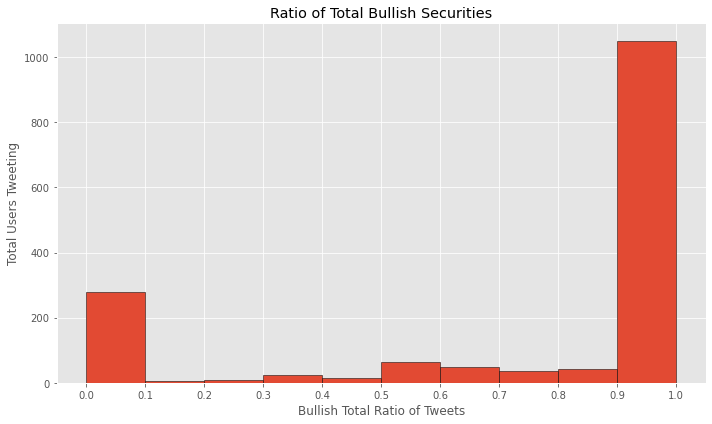

In [139]:
# Histogram for ratio's of Bullish to Total Tweets
x_ratios = sec_results['Bullish Percentages'].tolist()
bins = [0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]

plt.figure(figsize = (10,6))

plt.hist(x_ratios, bins = bins, edgecolor = 'black')

plt.title('Ratio of Total Bullish Securities')
plt.xlabel('Bullish Total Ratio of Tweets')
plt.ylabel('Total Users Tweeting')
plt.xticks(ticks = bins)

plt.tight_layout()

plt.show()

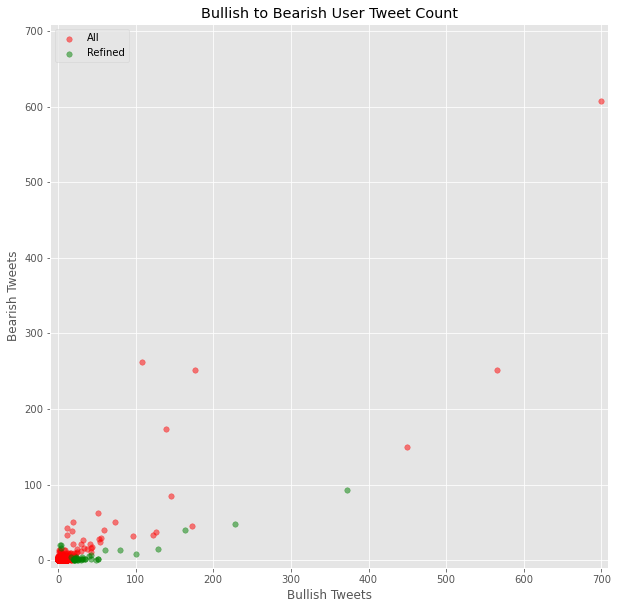

In [150]:
results_fil = sec_results.sort_values(by='Total', ascending= True)

x_bull = unpredictable_sec['Bullish Occurences'].tolist()
y_bear = unpredictable_sec['Bearish Occurences'].tolist()
s_total = unpredictable_sec['Total'].tolist()

x_bull_ref = predictable_sec['Bullish Occurences'].tolist()
y_bear_ref = predictable_sec['Bearish Occurences'].tolist()
s_total_ref = predictable_sec['Total'].tolist()

plt.figure(figsize=(10,10))

plt.scatter(x_bull, y_bear, s = 30, alpha = 0.5, c = 'r', label = 'All')
plt.scatter(x_bull_ref, y_bear_ref, s = 30, alpha = 0.5, c = 'g', label = 'Refined')

plt.legend(loc='upper left', fancybox = True)
plt.title('Bullish to Bearish Count of Tweets by Security')
plt.xlabel('Bullish Tweets')
plt.ylabel('Bearish Tweets')

# Find maximum plot value of bullish or bearish tweets
if max(x_bull) >= max(y_bear):
    plt.xlim(-10, max(x_bull) + 10)
    plt.ylim(-10, max(x_bull) + 10)
else:
    plt.xlim(-10, max(y_bear) + 10)
    plt.ylim(-10, max(y_bear) + 10)

plt.show()

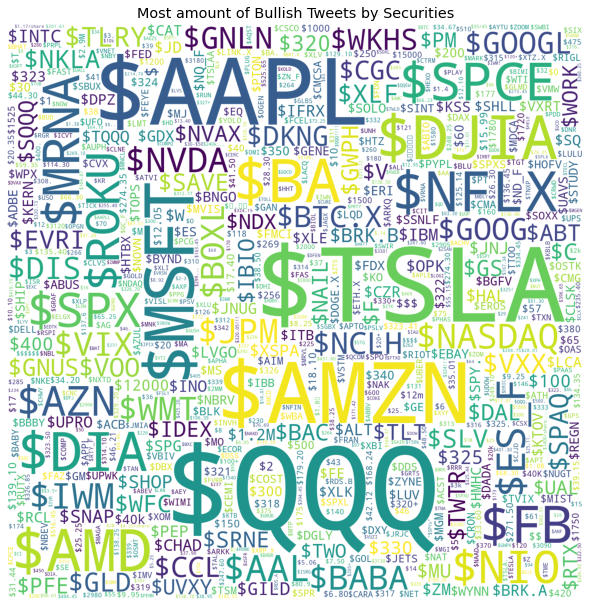

In [151]:
# Bullish User Word Cloud
word_freq = sec_results.set_index('Security')['Bullish Occurences'].to_dict()

wordcloud = WordCloud(width = 1500, 
                height = 1500, 
                background_color ='white',
                max_words = 800,
                max_font_size = 300, 
                min_font_size = 10).generate(str(results['Security'])) 

wordcloud.generate_from_frequencies(word_freq)
                      
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0)
plt.title('Most amount of Bullish Tweets by Securities')
  
plt.show() 

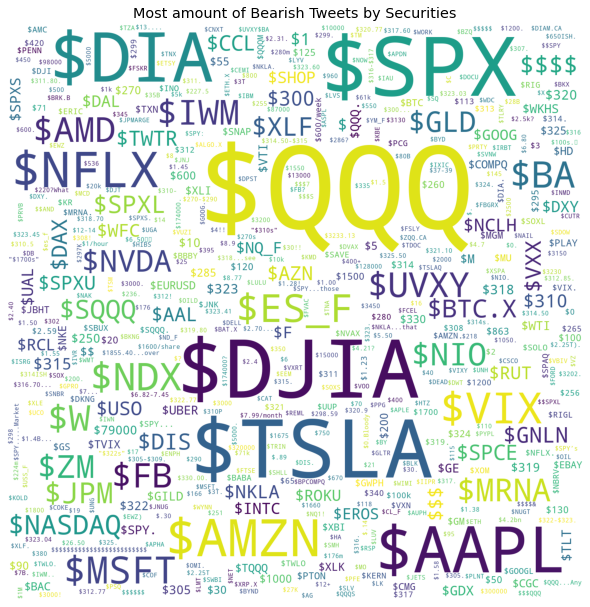

In [152]:
# Bullish User Word Cloud
word_freq = sec_results.set_index('Security')['Bearish Occurences'].to_dict()

wordcloud = WordCloud(width = 1500, 
                height = 1500, 
                background_color ='white',
                max_words = 800,
                max_font_size = 300, 
                min_font_size = 10).generate(str(sec_results['Security'])) 

wordcloud.generate_from_frequencies(word_freq)
                      
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0)
plt.title('Most amount of Bearish Tweets by Securities')
  
plt.show() 